# JUMP UMAP analysis with coSMicQC

This notebook analyzes [JUMP](https://jump-cellpainting.broadinstitute.org/) data (`cpg0000-jump-pilot`) by leveraging [UMAP](https://arxiv.org/abs/1802.03426) and [coSMicQC](https://github.com/cytomining/coSMicQC).

## Outline

We focus on a single file from the JUMP dataset: [`BR00117012.sqlite`](https://open.quiltdata.com/b/cellpainting-gallery/tree/cpg0000-jump-pilot/source_4/workspace/backend/2020_11_04_CPJUMP1/BR00117012/BR00117012.sqlite).
This file is downloaded and prepared by [CytoTable](https://github.com/cytomining/CytoTable) to form a single-cell [Parquet](https://parquet.apache.org/) file which includes all compartment feature data at the single-cell level.
We use coSMicQC to find and remove erroneous outlier data in order to prepare for UMAP analysis.
Afterwards, we use UMAP to demonstrate patterns within the data.

In [1]:
import logging
import pathlib
from typing import List, Optional

import holoviews
import hvplot.pandas
import numpy as np
import pandas as pd
import plotly.express as px
import pycytominer
import umap
from cytotable.convert import convert
from IPython.display import HTML, Image
from parsl.config import Config
from parsl.executors import ThreadPoolExecutor
from pyarrow import parquet

import cosmicqc

# set bokeh for visualizations with hvplot
hvplot.extension("bokeh")

# create a dir for images
pathlib.Path("./images").mkdir(exist_ok=True)

# avoid displaying plot export warnings
logging.getLogger("bokeh.io.export").setLevel(logging.ERROR)

# set the plate name for use throughout the notebook
example_plate = "BR00117012"

%opts magic unavailable (pyparsing cannot be imported)
%compositor magic unavailable (pyparsing cannot be imported)


## Define utility functions for use within this notebook

In [2]:
def generate_umap_embeddings(
    df_input: pd.DataFrame,
    cols_metadata_to_exclude: List[str],
    umap_n_components: int = 2,
    random_state: Optional[int] = None,
) -> np.ndarray:
    """
    Generates UMAP (Uniform Manifold Approximation and Projection)
    embeddings for a given input dataframe,
    excluding specified metadata columns.

    Args:
        df_input (pd.DataFrame]):
            A dataframe which is expected to contain
            numeric columns to be used for UMAP fitting.
        cols_metadata_to_exclude (List[str]):
            A list of column names representing
            metadata columns that should be excluded
            from the UMAP transformation.
        umap_n_components: (int):
            Number of components to use for UMAP.
            Default = 2.
        random_state (int):
            Number to use for random state and
            optional determinism.
            Default = None (random each time)
            Note: values besides None will turn
            off parallelism for umap-learn, likely
            meaning increased processing time.

    Returns:
        np.ndarray:
            A dataframe containing the UMAP embeddings
            with 2 components for each row in the input.
    """

    # Make sure to reinitialize UMAP instance per plate
    umap_fit = umap.UMAP(
        n_components=umap_n_components,
        random_state=random_state,
        # set the default value if we didn't set a random_state
        # otherwise set to 1 (umap-learn will override anyways).
        # this is set to avoid warnings from umap-learn during
        # processing.
        n_jobs=-1 if random_state is None else 1,
    )

    # Fit UMAP and convert to pandas DataFrame
    embeddings = umap_fit.fit_transform(
        X=df_input[
            [
                col
                for col in df_input.columns.tolist()
                if col not in cols_metadata_to_exclude and "cqc." not in col
            ]
            # select only numeric types from the dataframe
        ].select_dtypes(include=[np.number])
    )

    return embeddings

In [3]:
def plot_hvplot_scatter(
    embeddings: np.ndarray,
    title: str,
    filename: str,
    color_dataframe: Optional[pd.DataFrame] = None,
    color_column: Optional[str] = None,
    bgcolor: str = "black",
    cmap: str = "plasma",
    clabel: Optional[str] = None,
) -> holoviews.core.spaces.DynamicMap:
    """
    Creates an outlier-focused scatter hvplot for viewing
    UMAP embedding data with cosmicqc outliers coloration.

    Args:
        embeddings (np.ndarray]):
            A numpy ndarray which includes
            embedding data to display.
        title (str):
            Title for the UMAP scatter plot.
        filename (str):
            Filename which indicates where to export the
            plot.
        color_dataframe (pd.DataFrame):
            A dataframe which includes data used for
            color mapping within the plot. For example,
            coSMicQC .is_outlier columns.
        color_column (str):
            Column name from color_dataframe to use
            for coloring the scatter plot.
        bgcolor (str):
            Sets the background color of the plot.
        cmap (str):
            Sets the colormap used for the plot.
            See here for more:
            https://holoviews.org/user_guide/Colormaps.html
        clabel (str):
            Sets a label on the color map key displayed
            horizontally. Defaults to None (no label).

    Returns:
        holoviews.core.spaces.DynamicMap:
            A dynamic holoviews scatter plot which may be
            displayed in a Jupyter notebook.
    """

    # build a scatter plot through hvplot
    plot = pd.DataFrame(embeddings).hvplot.scatter(
        title=title,
        x="0",
        y="1",
        alpha=0.1,
        rasterize=True,
        c=(
            color_dataframe[color_column].astype(int).values
            if color_dataframe is not None
            else None
        ),
        cnorm="linear",
        cmap=cmap,
        bgcolor=bgcolor,
        height=700,
        width=800,
        clabel=clabel,
    )

    # export the plot
    hvplot.save(obj=plot, filename=filename, center=False)

    return plot

## Merge single-cell compartment data into one table

In [4]:
# check if we already have prepared data
if not pathlib.Path(f"./{example_plate}.parquet").is_file():
    # process BR00117012.sqlite using CytoTable to prepare data
    merged_single_cells = convert(
        source_path=(
            "s3://cellpainting-gallery/cpg0000-jump-pilot/source_4/workspace"
            "/backend/2020_11_04_CPJUMP1/BR00117012/BR00117012.sqlite"
        ),
        dest_path=f"./{example_plate}.parquet",
        dest_datatype="parquet",
        source_datatype="sqlite",
        chunk_size=8000,
        preset="cellprofiler_sqlite_cpg0016_jump",
        # allows AWS S3 requests without login
        no_sign_request=True,
        # use explicit cache to avoid temp cache removal
        local_cache_dir="./sqlite_s3_cache/",
        parsl_config=Config(
            executors=[ThreadPoolExecutor(label="tpe_for_jump_processing")]
        ),
        sort_output=False,
    )
else:
    merged_single_cells = f"./{example_plate}.parquet"

# read only the metadata from parquet file
parquet.ParquetFile(merged_single_cells).metadata

  created_by: parquet-cpp-arrow version 16.1.0
  num_columns: 5804
  num_rows: 279789
  num_row_groups: 14
  format_version: 2.6
  serialized_size: 12762532

## Process merged single-cell data using coSMicQC

In [5]:
# show the first few columns for metadata column names
schema_names = parquet.read_schema(merged_single_cells).names
schema_names[:12]

['Metadata_ImageNumber',
 'Image_Metadata_Row',
 'Image_Metadata_Site',
 'Metadata_ObjectNumber',
 'Metadata_ObjectNumber_1',
 'Metadata_ObjectNumber_2',
 'Metadata_Plate',
 'Metadata_Well',
 'Image_TableNumber',
 'Cytoplasm_AreaShape_Area',
 'Cytoplasm_AreaShape_BoundingBoxArea',
 'Cytoplasm_AreaShape_BoundingBoxMaximum_X']

In [6]:
# set a list of metadata columns for use throughout
metadata_cols = [
    "Metadata_ImageNumber",
    "Image_Metadata_Row",
    "Image_Metadata_Site",
    "Metadata_ObjectNumber",
    "Metadata_Plate",
    "Metadata_Well",
    "Image_TableNumber",
]

# read only metadata columns with feature columns used for outlier detection
df_merged_single_cells = pd.read_parquet(
    path=merged_single_cells,
    columns=[
        *metadata_cols,
        "Nuclei_AreaShape_Area",
        "Nuclei_AreaShape_FormFactor",
        "Nuclei_AreaShape_Eccentricity",
    ],
)
df_merged_single_cells.head()

,Metadata_ImageNumber,Image_Metadata_Row,Image_Metadata_Site,Metadata_ObjectNumber,Metadata_Plate,Metadata_Well,Image_TableNumber,Nuclei_AreaShape_Area,Nuclei_AreaShape_FormFactor,Nuclei_AreaShape_Eccentricity
0,2,1,2,2,BR00117012,A01,35196781680809101223867031596229856156,1091,0.895393,0.694154
1,2,1,2,3,BR00117012,A01,35196781680809101223867031596229856156,1007,0.837631,0.819062
2,2,1,2,4,BR00117012,A01,35196781680809101223867031596229856156,1368,0.833197,0.820257
3,2,1,2,5,BR00117012,A01,35196781680809101223867031596229856156,847,0.902995,0.345575
4,2,1,2,6,BR00117012,A01,35196781680809101223867031596229856156,983,0.863005,0.742060


In [7]:
# label outliers within the dataset
print("Large nuclei outliers:")
df_labeled_outliers = cosmicqc.analyze.find_outliers(
    df=df_merged_single_cells,
    metadata_columns=metadata_cols,
    feature_thresholds="large_nuclei",
)

Large nuclei outliers:
Number of outliers: 1355 (0.48%)
Outliers Range:
Nuclei_AreaShape_Area Min: 1754
Nuclei_AreaShape_Area Max: 4414
Nuclei_AreaShape_FormFactor Min: 0.3367261940249281
Nuclei_AreaShape_FormFactor Max: 0.7140072671383899


In [8]:
# label outliers within the dataset
print("Elongated nuclei outliers:")
df_labeled_outliers = cosmicqc.analyze.find_outliers(
    df=df_merged_single_cells,
    metadata_columns=metadata_cols,
    feature_thresholds="elongated_nuclei",
)

Elongated nuclei outliers:
Number of outliers: 15 (0.01%)
Outliers Range:
Nuclei_AreaShape_Eccentricity Min: 0.9868108584805481
Nuclei_AreaShape_Eccentricity Max: 0.9995098494433163


In [9]:
# label outliers within the dataset
print("Small and low formfactor nuclei outliers:")
df_labeled_outliers = cosmicqc.analyze.find_outliers(
    df=df_merged_single_cells,
    metadata_columns=metadata_cols,
    feature_thresholds="small_and_low_formfactor_nuclei",
)

Small and low formfactor nuclei outliers:
Number of outliers: 6548 (2.34%)
Outliers Range:
Nuclei_AreaShape_Area Min: 79
Nuclei_AreaShape_Area Max: 744
Nuclei_AreaShape_FormFactor Min: 0.0945907341645769
Nuclei_AreaShape_FormFactor Max: 0.7781815132858318


In [10]:
# label outliers within the dataset
df_labeled_outliers = cosmicqc.analyze.label_outliers(
    df=df_merged_single_cells,
    include_threshold_scores=True,
)
# show added columns
df_labeled_outliers[
    [col for col in df_labeled_outliers.columns.tolist() if "cqc." in col]
].head()

,cqc.small_and_low_formfactor_nuclei.Z_Score.Nuclei_AreaShape_Area,cqc.small_and_low_formfactor_nuclei.Z_Score.Nuclei_AreaShape_FormFactor,cqc.small_and_low_formfactor_nuclei.is_outlier,cqc.elongated_nuclei.Z_Score.Nuclei_AreaShape_Eccentricity,cqc.elongated_nuclei.is_outlier,cqc.large_nuclei.Z_Score.Nuclei_AreaShape_Area,cqc.large_nuclei.Z_Score.Nuclei_AreaShape_FormFactor,cqc.large_nuclei.is_outlier
0,0.030121,0.826248,False,-0.154094,False,0.030121,0.826248,False
1,-0.219592,-0.073800,False,0.765830,False,-0.219592,-0.073800,False
2,0.853580,-0.142903,False,0.774634,False,0.853580,-0.142903,False
3,-0.695236,0.944704,False,-2.721308,False,-0.695236,0.944704,False
4,-0.290938,0.321578,False,0.198723,False,-0.290938,0.321578,False


In [11]:
# create a column which indicates whether an erroneous outlier was detected
# from all cosmicqc outlier threshold sets. For ex. True for is_outlier in
# one threshold set out of three would show True for this column. False for
# is_outlier in all threshold sets would show False for this column.
df_labeled_outliers["analysis.included_at_least_one_outlier"] = df_labeled_outliers[
    [col for col in df_labeled_outliers.columns.tolist() if ".is_outlier" in col]
].any(axis=1)

# show value counts for all outliers
outliers_counts = df_labeled_outliers[
    "analysis.included_at_least_one_outlier"
].value_counts()
outliers_counts

analysis.included_at_least_one_outlier
False    271883
True       7906
Name: count, dtype: int64

In [12]:
# show the percentage of total dataset
print(
    (outliers_counts.iloc[1] / outliers_counts.iloc[0]) * 100,
    "%",
    "of",
    outliers_counts.iloc[0],
    "include erroneous outliers of some kind.",
)

2.9078684581235312 % of 271883 include erroneous outliers of some kind.


## Prepare data for analysis with pycytominer

In [14]:
parquet_sampled_with_outliers = f"./{example_plate}_sampled_with_outliers.parquet"

# check if we already have normalized data
if not pathlib.Path(parquet_sampled_with_outliers).is_file():
    # set a fraction for sampling to limit the amount
    # of data processed based on system memory constraints.
    # note: data was processed on system with 16 CPU, 64 GB ram
    sample_fraction = 0.44

    # read the dataset
    df_features = pd.read_parquet(f"./{example_plate}.parquet")

    # group by metadata_well for all features then sample
    # the dataset by a fraction.
    df_features = (
        # note: we add the column selection here to avoid a pandas
        # DeprecationWarning. See the following link for more details:
        # https://stackoverflow.com/questions/77969964/deprecation-warning-with-groupby-apply
        df_features.groupby(["Metadata_Well"])[df_features.columns]
        .apply(lambda x: x.sample(frac=sample_fraction))
        .reset_index(drop=True)
    )

    # join the sampled feature data with the cosmicqc outlier data
    df_features_with_cqc_outlier_data = df_features.merge(
        # select metadata columns plus those which don't exist in
        # df_features (cosmicqc or analysis-specific columns)
        df_labeled_outliers[
            [
                *metadata_cols,
                *[
                    col
                    for col in df_labeled_outliers.columns
                    if col not in df_features.columns
                ],
            ]
        ],
        how="inner",
        left_on=metadata_cols,
        right_on=metadata_cols,
    )

    df_features_with_cqc_outlier_data.to_parquet(parquet_sampled_with_outliers)

else:
    df_features_with_cqc_outlier_data = pd.read_parquet(parquet_sampled_with_outliers)

df_features_with_cqc_outlier_data

,Metadata_ImageNumber,Image_Metadata_Row,Image_Metadata_Site,Metadata_ObjectNumber,Metadata_ObjectNumber_1,Metadata_ObjectNumber_2,Metadata_Plate,Metadata_Well,Image_TableNumber,Cytoplasm_AreaShape_Area,...,Nuclei_Texture_Variance_RNA_5_03_256,cqc.small_and_low_formfactor_nuclei.Z_Score.Nuclei_AreaShape_Area,cqc.small_and_low_formfactor_nuclei.Z_Score.Nuclei_AreaShape_FormFactor,cqc.small_and_low_formfactor_nuclei.is_outlier,cqc.elongated_nuclei.Z_Score.Nuclei_AreaShape_Eccentricity,cqc.elongated_nuclei.is_outlier,cqc.large_nuclei.Z_Score.Nuclei_AreaShape_Area,cqc.large_nuclei.Z_Score.Nuclei_AreaShape_FormFactor,cqc.large_nuclei.is_outlier,analysis.included_at_least_one_outlier
0,9,1,9,36,36,36,BR00117012,A01,123427782301510124726705416481797689855,3816,...,17.533683,-0.415795,0.971457,False,-0.130095,False,-0.415795,0.971457,False,False
1,8,1,8,3,3,3,BR00117012,A01,195970212232453775991782680321528206390,3042,...,7.773093,-0.166082,-2.590543,False,1.539330,False,-0.166082,-2.590543,False,False
2,5,1,5,47,47,47,BR00117012,A01,327256301155101152193147088571265307381,4343,...,5.135272,1.596773,0.052141,False,0.483920,False,1.596773,0.052141,False,False
3,7,1,7,50,50,50,BR00117012,A01,40464853431235667657927130465268580453,4114,...,6.922958,0.184705,0.997999,False,-0.488523,False,0.184705,0.997999,False,False
4,7,1,7,17,17,17,BR00117012,A01,40464853431235667657927130465268580453,2239,...,3.321053,-0.531733,1.294974,False,-0.612494,False,-0.531733,1.294974,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117508,3454,16,7,68,68,68,BR00117012,P24,53376628655035216909378587811283720456,5259,...,53.436383,1.367870,0.176541,False,0.095166,False,1.367870,0.176541,False,False
117509,3448,16,1,65,65,65,BR00117012,P24,115066026069838743189211380847920733616,2777,...,6.429991,-0.290938,-1.220927,False,1.124422,False,-0.290938,-1.220927,False,False
117510,3451,16,4,87,87,87,BR00117012,P24,202830213553184495296857704660514325554,3542,...,7.046681,-0.347421,0.684254,False,0.167217,False,-0.347421,0.684254,False,False
117511,3454,16,7,76,76,76,BR00117012,P24,53376628655035216909378587811283720456,2646,...,20.230426,-0.671454,-0.050317,False,-1.363158,False,-0.671454,-0.050317,False,False


In [15]:
# show our data value counts regarding outliers vs inliers
df_features_with_cqc_outlier_data[
    "analysis.included_at_least_one_outlier"
].value_counts()

analysis.included_at_least_one_outlier
False    114138
True       3375
Name: count, dtype: int64

In [16]:
# prepare data for normalization and feature selection
# by removing cosmicqc and analaysis focused columns.
df_for_normalize_and_feature_select = df_features_with_cqc_outlier_data[
    # read feature names from cytotable output, which excludes
    # cosmicqc-added columns.
    parquet.read_schema(merged_single_cells).names
]
# show the modified column count
len(df_for_normalize_and_feature_select.columns)

5804

In [17]:
# join JUMP metadata with platemap data to prepare for annotation
df_platemap_and_metadata = pd.read_csv(
    filepath_or_buffer=(
        "s3://cellpainting-gallery/cpg0000-jump-pilot/source_4"
        "/workspace/metadata/platemaps/2020_11_04_CPJUMP1/"
        "platemap/JUMP-Target-1_compound_platemap.txt"
    ),
    sep="\t",
).merge(
    right=pd.read_csv(
        filepath_or_buffer=(
            "s3://cellpainting-gallery/cpg0000-jump-pilot/source_4"
            "/workspace/metadata/external_metadata/"
            "JUMP-Target-1_compound_metadata.tsv"
        ),
        sep="\t",
    ),
    left_on="broad_sample",
    right_on="broad_sample",
)

In [18]:
parquet_pycytominer_annotated = f"./{example_plate}_annotated.parquet"

# check if we already have annotated data
if not pathlib.Path(parquet_pycytominer_annotated).is_file():
    # annotate the data using pycytominer
    pycytominer.annotate(
        profiles=df_for_normalize_and_feature_select,
        # read the platemap directly from AWS S3 related location
        platemap=df_platemap_and_metadata,
        join_on=["Metadata_well_position", "Metadata_Well"],
        output_file=parquet_pycytominer_annotated,
        output_type="parquet",
    )

In [19]:
parquet_pycytominer_normalized = f"./{example_plate}_normalized.parquet"

# check if we already have normalized data
if not pathlib.Path(parquet_pycytominer_normalized).is_file():
    # normalize the data using pcytominer
    df_pycytominer_normalized = pycytominer.normalize(
        profiles=parquet_pycytominer_annotated,
        features="infer",
        image_features=False,
        meta_features="infer",
        method="standardize",
        samples="Metadata_control_type == 'negcon'",
        output_file=parquet_pycytominer_normalized,
        output_type="parquet",
    )

In [20]:
parquet_pycytominer_feature_selected = f"./{example_plate}_feature_select.parquet"

# check if we already have feature selected data
if not pathlib.Path(parquet_pycytominer_feature_selected).is_file():
    # feature select normalized data using pycytominer
    df_pycytominer_feature_selected = pycytominer.feature_select(
        profiles=parquet_pycytominer_normalized,
        operation=[
            "variance_threshold",
            "correlation_threshold",
            "blocklist",
            "drop_na_columns",
        ],
        na_cutoff=0,
        output_file=parquet_pycytominer_feature_selected,
        output_type="parquet",
    )

In [21]:
# regather metadata columns to account for new additions
all_metadata_cols = [
    col
    for col in parquet.read_schema(parquet_pycytominer_feature_selected).names
    if col.startswith("Metadata_")
]
all_metadata_cols

['Metadata_broad_sample',
 'Metadata_solvent',
 'Metadata_InChIKey',
 'Metadata_pert_iname',
 'Metadata_pubchem_cid',
 'Metadata_gene',
 'Metadata_pert_type',
 'Metadata_control_type',
 'Metadata_smiles',
 'Metadata_ImageNumber',
 'Metadata_ObjectNumber',
 'Metadata_ObjectNumber_1',
 'Metadata_ObjectNumber_2',
 'Metadata_Plate',
 'Metadata_Well']

In [22]:
# calculate UMAP embeddings from the data
# which was prepared by pycytominer.
embeddings_with_outliers = generate_umap_embeddings(
    df_input=pd.read_parquet(parquet_pycytominer_feature_selected),
    cols_metadata_to_exclude=all_metadata_cols,
    random_state=0,
)
# show the shape and top values from the embeddings array
print(embeddings_with_outliers.shape)
embeddings_with_outliers[:3]

(117513, 2)


array([[-0.39003304,  4.0597053 ],
       [ 0.430353  ,  5.700904  ],
       [-0.33348054,  4.008859  ]], dtype=float32)

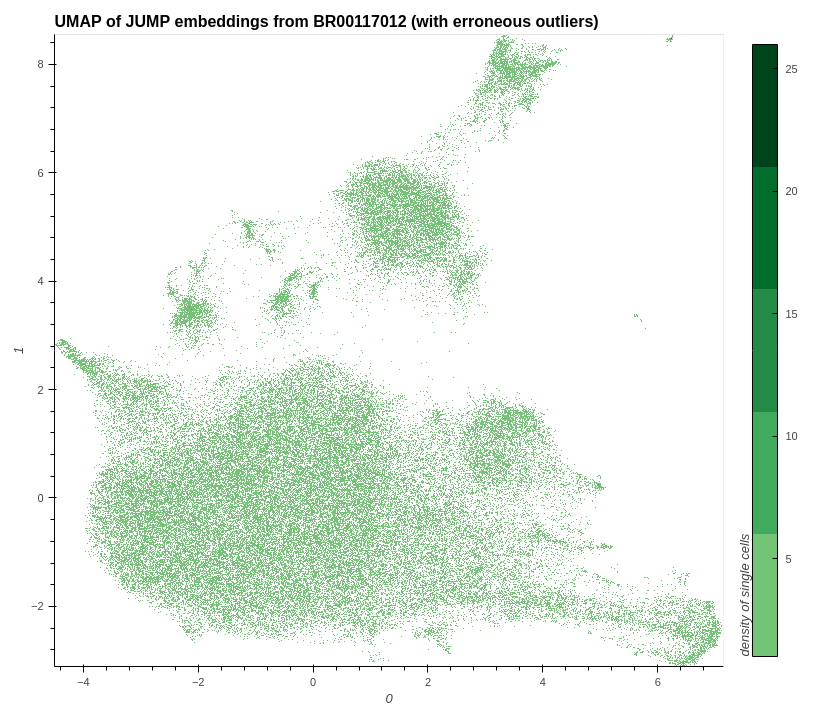

In [23]:
plot_hvplot_scatter(
    embeddings=embeddings_with_outliers,
    title=f"UMAP of JUMP embeddings from {example_plate} (with erroneous outliers)",
    filename=(
        image_with_all_outliers
        := f"./images/umap_with_all_outliers_{example_plate}.png"
    ),
    bgcolor="white",
    cmap=px.colors.sequential.Greens[4:],
    clabel="density of single cells",
)
# conserve filespace by displaying export instead of dynamic plot
Image(image_with_all_outliers)

In [24]:
# show a UMAP for all outliers within the data
plot_hvplot_scatter(
    embeddings=embeddings_with_outliers,
    title=f"UMAP of JUMP all coSMicQC erroneous outliers within {example_plate}",
    filename=f"./images/umap_erroneous_outliers_{example_plate}.png",
    color_dataframe=df_features_with_cqc_outlier_data,
    color_column="analysis.included_at_least_one_outlier",
    clabel="density of single cells classified as outliers",
)

:DynamicMap   []
   :Image   [0,1]   (0_1 _color)

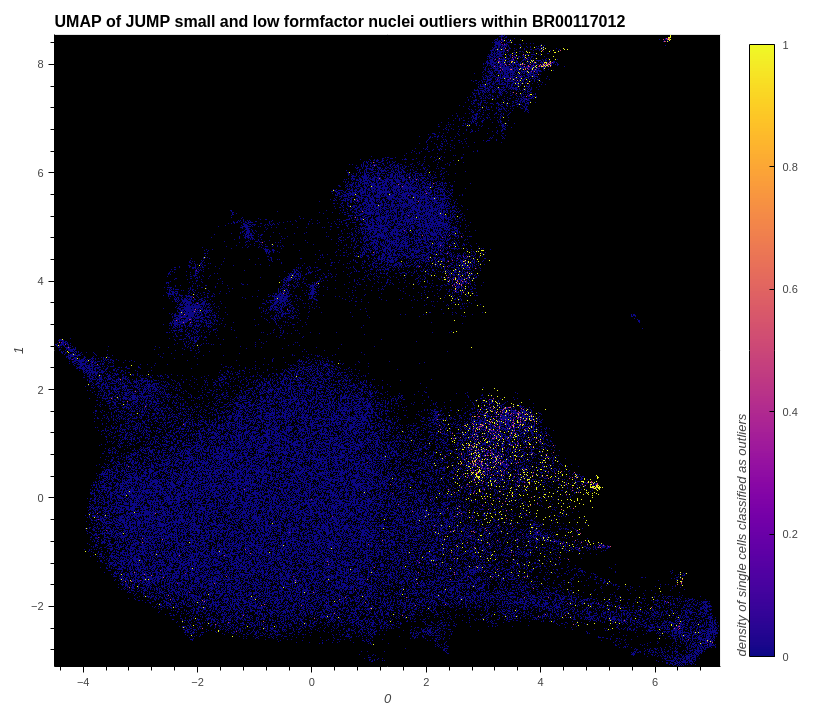

In [25]:
# show small and low formfactor nuclei outliers within the data
plot_hvplot_scatter(
    embeddings=embeddings_with_outliers,
    title=f"UMAP of JUMP small and low formfactor nuclei outliers within {example_plate}",
    filename=(
        plot_image
        := f"./images/umap_small_and_low_formfactor_nuclei_outliers_{example_plate}.png"
    ),
    color_dataframe=df_features_with_cqc_outlier_data,
    color_column="cqc.small_and_low_formfactor_nuclei.is_outlier",
    clabel="density of single cells classified as outliers",
)
# conserve filespace by displaying export instead of dynamic plot
Image(plot_image)

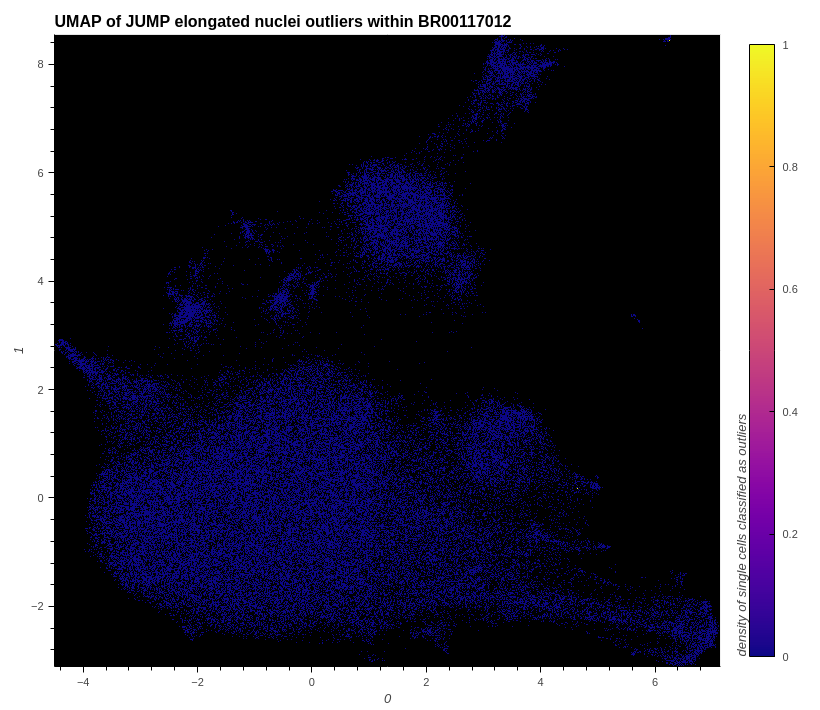

In [26]:
# show elongated nuclei outliers within the data
plot_hvplot_scatter(
    embeddings=embeddings_with_outliers,
    title=f"UMAP of JUMP elongated nuclei outliers within {example_plate}",
    filename=(
        plot_image := f"./images/umap_elongated_nuclei_outliers_{example_plate}.png"
    ),
    color_dataframe=df_features_with_cqc_outlier_data,
    color_column="cqc.elongated_nuclei.is_outlier",
    clabel="density of single cells classified as outliers",
)
# conserve filespace by displaying export instead of dynamic plot
Image(plot_image)

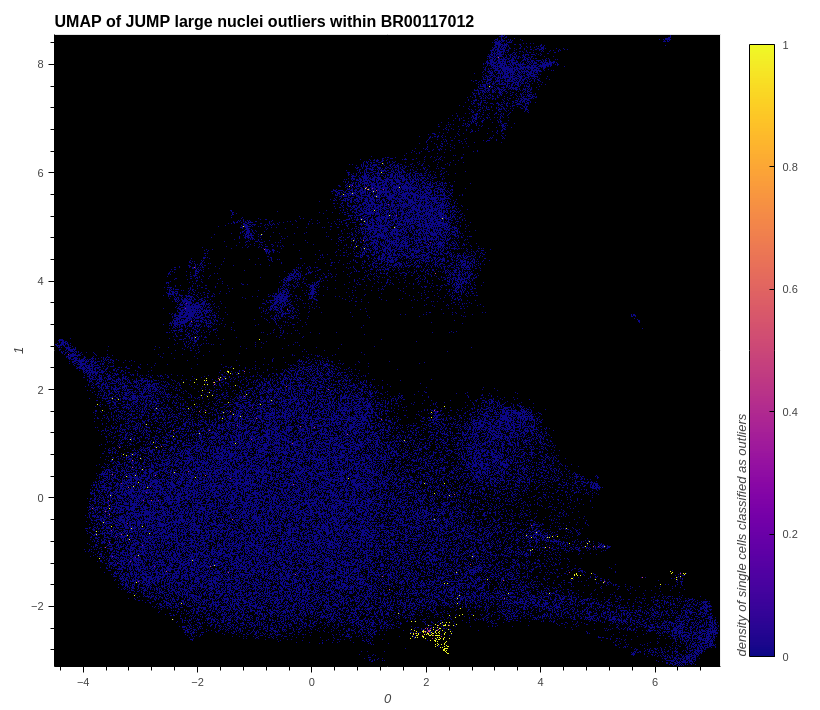

In [27]:
# show small and large nuclei outliers within the data
plot_hvplot_scatter(
    embeddings=embeddings_with_outliers,
    title=f"UMAP of JUMP large nuclei outliers within {example_plate}",
    filename=(plot_image := f"./images/umap_large_nuclei_outliers_{example_plate}.png"),
    color_dataframe=df_features_with_cqc_outlier_data,
    color_column="cqc.large_nuclei.is_outlier",
    clabel="density of single cells classified as outliers",
)
# conserve filespace by displaying export instead of dynamic plot
Image(plot_image)

In [28]:
# prepare data for normalization and feature selection
# by removing cosmicqc and analaysis focused columns.
df_for_normalize_and_feature_select_without_outliers = (
    df_features_with_cqc_outlier_data[
        # seek values which are false (not considered an outlier)
        ~df_features_with_cqc_outlier_data["analysis.included_at_least_one_outlier"]
    ][
        # read feature names from cytotable output, which excludes
        # cosmicqc-added columns.
        parquet.read_schema(merged_single_cells).names
    ]
)
# show the modified column count
len(df_for_normalize_and_feature_select_without_outliers.columns)

df_for_normalize_and_feature_select_without_outliers

,Metadata_ImageNumber,Image_Metadata_Row,Image_Metadata_Site,Metadata_ObjectNumber,Metadata_ObjectNumber_1,Metadata_ObjectNumber_2,Metadata_Plate,Metadata_Well,Image_TableNumber,Cytoplasm_AreaShape_Area,...,Nuclei_Texture_Variance_RNA_10_02_256,Nuclei_Texture_Variance_RNA_10_03_256,Nuclei_Texture_Variance_RNA_3_00_256,Nuclei_Texture_Variance_RNA_3_01_256,Nuclei_Texture_Variance_RNA_3_02_256,Nuclei_Texture_Variance_RNA_3_03_256,Nuclei_Texture_Variance_RNA_5_00_256,Nuclei_Texture_Variance_RNA_5_01_256,Nuclei_Texture_Variance_RNA_5_02_256,Nuclei_Texture_Variance_RNA_5_03_256
0,9,1,9,36,36,36,BR00117012,A01,123427782301510124726705416481797689855,3816,...,17.710557,18.991890,18.447506,18.367887,18.701323,17.702356,17.615662,17.587456,17.953973,17.533683
1,8,1,8,3,3,3,BR00117012,A01,195970212232453775991782680321528206390,3042,...,8.179383,6.671637,7.189478,7.536011,7.104708,7.279566,7.302198,7.580178,7.376624,7.773093
2,5,1,5,47,47,47,BR00117012,A01,327256301155101152193147088571265307381,4343,...,5.163118,5.640761,5.020867,4.992194,5.184511,5.008445,5.055747,4.964113,5.162984,5.135272
3,7,1,7,50,50,50,BR00117012,A01,40464853431235667657927130465268580453,4114,...,7.258791,7.610346,6.637604,6.817955,6.711880,6.838380,6.808615,7.053098,6.868436,6.922958
4,7,1,7,17,17,17,BR00117012,A01,40464853431235667657927130465268580453,2239,...,3.551165,3.746588,3.351621,3.306194,3.172812,3.165931,3.354827,3.333333,3.170766,3.321053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117508,3454,16,7,68,68,68,BR00117012,P24,53376628655035216909378587811283720456,5259,...,41.944830,56.983976,46.352110,39.910755,48.548599,52.983990,41.889314,38.855503,45.221182,53.436383
117509,3448,16,1,65,65,65,BR00117012,P24,115066026069838743189211380847920733616,2777,...,7.326642,7.853596,6.997897,6.980528,6.350092,6.186232,6.905416,6.896725,6.223140,6.429991
117510,3451,16,4,87,87,87,BR00117012,P24,202830213553184495296857704660514325554,3542,...,6.781933,6.532444,7.127214,6.905356,6.895536,6.937326,7.191295,6.893606,6.980451,7.046681
117511,3454,16,7,76,76,76,BR00117012,P24,53376628655035216909378587811283720456,2646,...,19.973679,22.506483,20.690118,20.081294,22.259422,20.408965,20.774290,19.253769,20.838725,20.230426


In [29]:
print("Length of dataset with outliers: ", len(df_for_normalize_and_feature_select))
print(
    "Length of dataset without outliers: ",
    len(df_for_normalize_and_feature_select_without_outliers),
)

Length of dataset with outliers:  117513
Length of dataset without outliers:  114138


In [30]:
parquet_pycytominer_annotated_wo_outliers = (
    f"./{example_plate}_annotated_wo_outliers.parquet"
)

# check if we already have annotated data
if not pathlib.Path(parquet_pycytominer_annotated_wo_outliers).is_file():
    # annotate the data using pycytominer
    pycytominer.annotate(
        profiles=df_for_normalize_and_feature_select_without_outliers,
        # read the platemap directly from AWS S3 related location
        platemap=df_platemap_and_metadata,
        join_on=["Metadata_well_position", "Metadata_Well"],
        output_file=parquet_pycytominer_annotated_wo_outliers,
        output_type="parquet",
    )

In [31]:
parquet_pycytominer_normalized_wo_outliers = (
    f"./{example_plate}_normalized_wo_outliers.parquet"
)

# check if we already have normalized data
if not pathlib.Path(parquet_pycytominer_normalized_wo_outliers).is_file():
    # normalize the data using pcytominer
    df_pycytominer_normalized = pycytominer.normalize(
        profiles=parquet_pycytominer_annotated_wo_outliers,
        features="infer",
        image_features=False,
        meta_features="infer",
        method="standardize",
        samples="Metadata_control_type == 'negcon'",
        output_file=parquet_pycytominer_normalized_wo_outliers,
        output_type="parquet",
    )

In [32]:
parquet_pycytominer_feature_selected_wo_outliers = (
    f"./{example_plate}_feature_select_wo_outliers.parquet"
)

# check if we already have feature selected data
if not pathlib.Path(parquet_pycytominer_feature_selected_wo_outliers).is_file():
    # feature select normalized data using pycytominer
    df_pycytominer_feature_selected = pycytominer.feature_select(
        profiles=parquet_pycytominer_normalized_wo_outliers,
        operation=[
            "variance_threshold",
            "correlation_threshold",
            "blocklist",
            "drop_na_columns",
        ],
        na_cutoff=0,
        output_file=parquet_pycytominer_feature_selected_wo_outliers,
        output_type="parquet",
    )

In [33]:
# calculate UMAP embeddings from data without coSMicQC-detected outliers
embeddings_without_outliers = generate_umap_embeddings(
    df_input=pd.read_parquet(parquet_pycytominer_feature_selected_wo_outliers),
    cols_metadata_to_exclude=all_metadata_cols,
    random_state=0,
)
# show the shape and top values from the embeddings array
print(embeddings_without_outliers.shape)
embeddings_without_outliers[:3]

(114138, 2)


array([[-0.5193578 ,  3.6437721 ],
       [ 0.13389692,  5.410578  ],
       [-0.40673473,  3.684243  ]], dtype=float32)

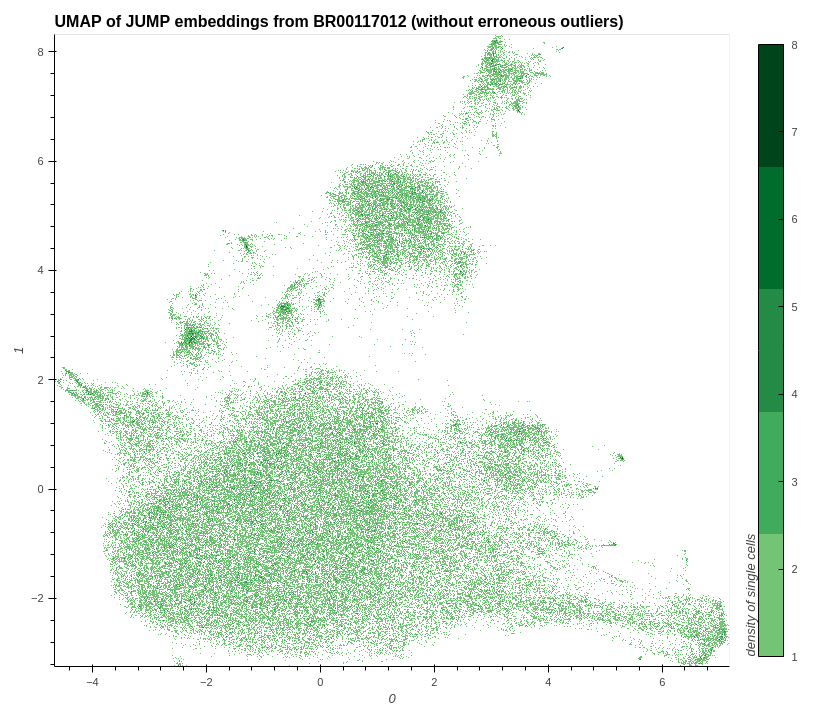

In [34]:
# plot UMAP for embeddings without outliers
plot_hvplot_scatter(
    embeddings=embeddings_without_outliers,
    title=f"UMAP of JUMP embeddings from {example_plate} (without erroneous outliers)",
    filename=(
        image_without_all_outliers
        := f"./images/umap_without_outliers_{example_plate}.png"
    ),
    bgcolor="white",
    cmap=px.colors.sequential.Greens[4:],
    clabel="density of single cells",
)
# conserve filespace by displaying export instead of dynamic plot
Image(image_without_all_outliers)

In [35]:
# compare the UMAP images with and without outliers side by side
HTML(
    f"""
    <div style="display: flex;">
      <img src="{image_with_all_outliers}" alt="UMAP which includes erroneous outliers" style="width: 50%;"/>
      <img src="{image_without_all_outliers}" alt="UMAP which includes no erroneous outliers" style="width: 50%;"/>
    </div>
    """
)

In [36]:
# concatenate embeddings together
combined_embeddings = np.vstack((embeddings_with_outliers, embeddings_without_outliers))

# Step 2: Create the labels array
combined_labels = np.concatenate(
    [np.zeros(len(embeddings_with_outliers)), np.ones(len(embeddings_without_outliers))]
)

# visualize UMAP embeddings both with and without outliers together for comparison
plot_hvplot_scatter(
    embeddings=combined_embeddings,
    title=f"UMAP comparing JUMP embeddings from {example_plate} with and without erroneous outliers",
    filename=f"./images/umap_comparison_with_and_without_erroneous_outliers_{example_plate}.png",
    color_dataframe=pd.DataFrame(
        combined_labels, columns=["combined_embedding_color_label"]
    ),
    color_column="combined_embedding_color_label",
    bgcolor="white",
    cmap=[
        "#e76f51",  # Darkest Orange
        "#f4a261",  # Darker Orange
        "#ffbb78",  # Light Orange
        "#aec7e8",  # Light Blue
        "#6baed6",  # Darker Blue
        "#1f77b4",  # Darkest Blue
    ],
    clabel="density of single cells with (orange) and without outliers (blue)",
)

:DynamicMap   []
   :Image   [0,1]   (0_1 _color)